## Import library

In [1]:
import re
import string

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
import keras
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
import tensorflow as tf
import tensorflow_text as text
from transformers import pipeline
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import confusion_matrix, classification_report
import streamlit as st

from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

%config Completer.use_jedi = False
pd.set_option("display.max_colwidth", 1000)
pd.set_option('display.max_rows', None)

In [2]:
data =  pd.read_csv('review_hotel.csv',encoding='latin1')

In [3]:
data

,review_id,review_text,category
0,0fc651bfdd38a3b4ba19ef9d0d1e92e3,"Penginapannya rapi, bersih, suasana tenang, pelayannya ramah dan banyak membantu. Lokasi cukup dekat ke beberapa obyek wisata. kalau saya ke bandung lagi mungkin saya akan menginap lagi di sini.",1
1,7d8cb2e465c5602e51c1ba8710e8ff16,"wifi tidak sampai kamar, tidak tersedia heater untuk kopi/teh atau dispenser dan tidak tersedia kursi di depan kamar untuk merokok hingga harus duduk di lantai",0
2,1f4447c73e5e1aac462d05b0ecbd5a55,"Lantai kamar mandi kotor, bau, dan seperti sdh jdi sarang nyamuk dikamar mandinya...pesan superior double yg dikasih twin...mungkin karena murah saya maklumin, tpi kedepan mohon untuk bisa jdi perbaikan untuk bisa lbh baik lg..",0
3,b9aefbfb0debbfff43f8b268c82b43c0,"Wc jorok.. Kasur tidak dibersihkan,, handuk tidak diganti,",0
4,e2afef18bd695fae43d4d53b8c547bd4,bocor lagi,0
5,a45d79bde831ad1306adbd8ffb5d3d50,"kebersihan, pelayanan, kerapihan",0
6,ecdf90bd55184829caae18e5423a2e53,saya hampir tidak bisa tidur krn bantal sangat bau apek,0
7,b0a8cb904f0536dca57bd5be090e510c,"Pelayanannya sangat baik,kmr yang bersih,menu makanannya juga enak to sayang wifinya kutang bagus..",1
8,c2dd2ab5fd6880dc2ca8c3901f88dc53,"Kamar banyak kecoa, tlg lebih diperhatikan kebersihannya",0
9,4018a964e23acd6f0363fda9cbbc92ec,kamar mandi banjir,0


## PreProcessing

### Menghilangkan spasi, tanda baca, dan membuat huruf menjadi huruf kecil

In [4]:
punctuations = re.sub(r"[!<_>#:)\.]", "", string.punctuation)

def punct2wspace(text):
    return re.sub(r"[{}]+".format(punctuations), " ", text)

def normalize_wspace(text):
    return re.sub(r"\s+", " ", text)

def casefolding(text):
    return text.lower()

def preprocess_text(text):
    text = punct2wspace(text)
    text = normalize_wspace(text)
    text = casefolding(text)
    return text

preprocess_text("Wc jorok.. Kasur tidak dibersihkan,, handuk tidak diganti,")

'wc jorok kasur tidak dibersihkan handuk tidak diganti '

In [5]:
data["cleaned_review"] = data["review_text"].apply(preprocess_text)
data.head()

,review_id,review_text,category,cleaned_review
0,0fc651bfdd38a3b4ba19ef9d0d1e92e3,"Penginapannya rapi, bersih, suasana tenang, pelayannya ramah dan banyak membantu. Lokasi cukup dekat ke beberapa obyek wisata. kalau saya ke bandung lagi mungkin saya akan menginap lagi di sini.",1,penginapannya rapi bersih suasana tenang pelayannya ramah dan banyak membantu lokasi cukup dekat ke beberapa obyek wisata kalau saya ke bandung lagi mungkin saya akan menginap lagi di sini
1,7d8cb2e465c5602e51c1ba8710e8ff16,"wifi tidak sampai kamar, tidak tersedia heater untuk kopi/teh atau dispenser dan tidak tersedia kursi di depan kamar untuk merokok hingga harus duduk di lantai",0,wifi tidak sampai kamar tidak tersedia heater untuk kopi teh atau dispenser dan tidak tersedia kursi di depan kamar untuk merokok hingga harus duduk di lantai
2,1f4447c73e5e1aac462d05b0ecbd5a55,"Lantai kamar mandi kotor, bau, dan seperti sdh jdi sarang nyamuk dikamar mandinya...pesan superior double yg dikasih twin...mungkin karena murah saya maklumin, tpi kedepan mohon untuk bisa jdi perbaikan untuk bisa lbh baik lg..",0,lantai kamar mandi kotor bau dan seperti sdh jdi sarang nyamuk dikamar mandinya pesan superior double yg dikasih twin mungkin karena murah saya maklumin tpi kedepan mohon untuk bisa jdi perbaikan untuk bisa lbh baik lg
3,b9aefbfb0debbfff43f8b268c82b43c0,"Wc jorok.. Kasur tidak dibersihkan,, handuk tidak diganti,",0,wc jorok kasur tidak dibersihkan handuk tidak diganti
4,e2afef18bd695fae43d4d53b8c547bd4,bocor lagi,0,bocor lagi


In [6]:
datax = data.drop(['review_id','review_text'],axis=1)

## EDA

In [8]:
yes = datax[datax.category==1]
no = datax[datax.category==0]

In [9]:
pd.DataFrame(yes['cleaned_review'].str.findall("(:\S+)").explode().value_counts())

,cleaned_review
:),12
:v,1
:lokasi,1


In [10]:
count_yes = pd.Series(' '.join(yes["cleaned_review"]).split()).value_counts()[:100]

dan             892
bersih          700
nyaman          607
kamar           594
di              385
yang            379
bagus           321
ramah           310
untuk           302
dengan          298
hotel           295
sangat          285
tidak           283
ada             258
harga           242
pelayanan       234
baik            209
tapi            206
tempat          195
dekat           195
saya            192
nya             187
cukup           185
lokasi          184
juga            176
kurang          175
and             165
the             163
mandi           149
kamarnya        149
tempatnya       147
air             145
strategis       145
lumayan         145
memuaskan       144
sesuai          141
banget          140
menginap        133
murah           133
fasilitas       119
good            118
ke              116
yg              115
buat            113
dari            113
hanya           111
ac              110
oke             108
airy            107
cuma            107


In [11]:
col = ['Index','Kata','Jumlah']
count_yes = pd.DataFrame(count_yes).reset_index()
count_yes.columns
count_yes = count_yes.rename({'index':'Kata',0:'Jumlah'},axis=1)

In [13]:
count_no = pd.Series(' '.join(no["cleaned_review"]).split()).value_counts()[:100]
count_no

kamar         7929
tidak         6029
ada           4744
dan           4538
di            4308
kurang        3353
nya           2656
mandi         2471
air           2417
yg            2407
saya          2142
airy          1813
ga            1787
kotor         1676
ac            1636
bau           1447
gak           1438
sangat        1427
hotel         1398
tdk           1396
bersih        1312
yang          1217
bisa          1121
tapi          1097
dingin        1027
panas          998
pelayanan      986
untuk          978
banyak         970
sesuai         922
baik           887
kamarnya       861
dengan         856
tv             835
juga           835
ke             812
ramah          807
tempat         799
handuk         773
nyaman         771
wifi           763
sudah          712
dari           708
kecewa         699
rusak          693
2              684
sekali         669
bagus          664
ini            663
jadi           656
jam            649
kecil          630
seperti     

In [14]:
col = ['Index','Kata','Jumlah']
count_no = pd.DataFrame(count_no).reset_index()
count_no.columns
count_no = count_no.rename({'index':'Kata',0:'Jumlah'},axis=1)

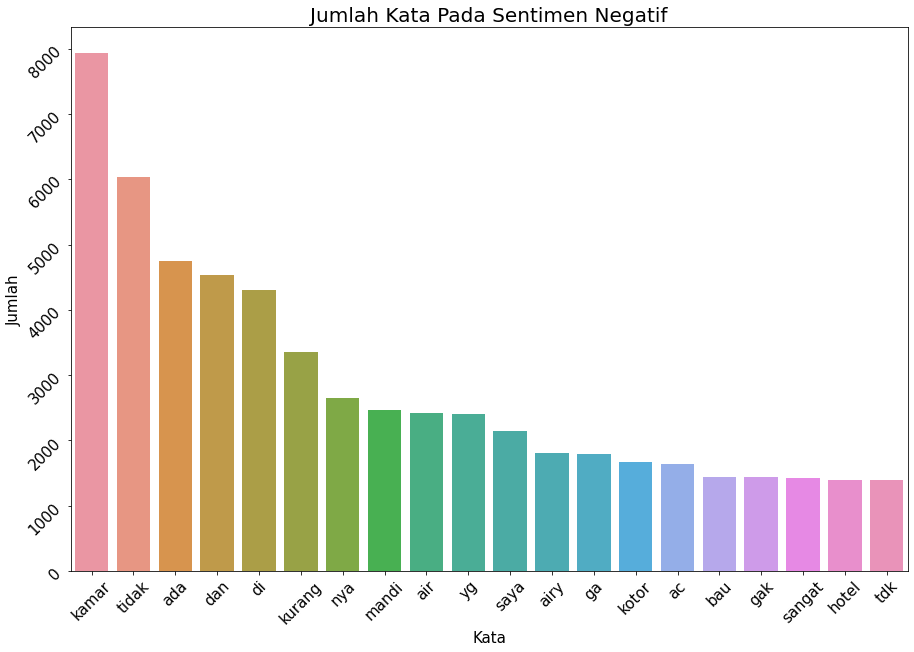

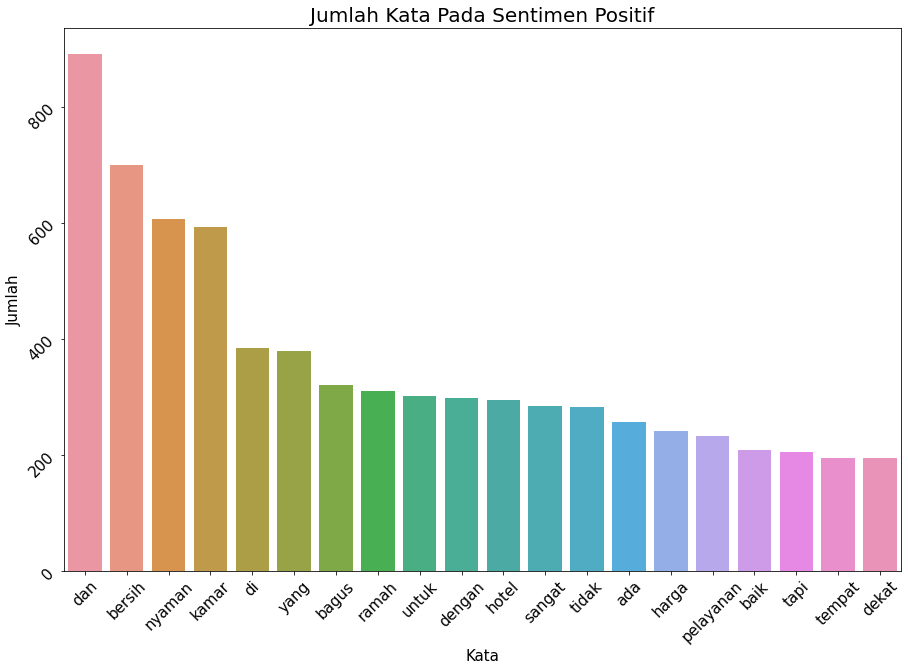

In [16]:
plt.figure(figsize=[15,10])
plt.title('Jumlah Kata Pada Sentimen Negatif', fontsize=20)
sns.barplot(x='Kata',y='Jumlah',data=count_no[:20])
plt.xticks(rotation=45, fontsize=15)
plt.yticks(rotation=45, fontsize=15)
plt.xlabel('Kata',fontsize=15)
plt.ylabel('Jumlah',fontsize=15)
plt.show()
plt.figure(figsize=[15,10])
plt.title('Jumlah Kata Pada Sentimen Positif', fontsize=20)
sns.barplot(x='Kata',y='Jumlah',data=count_yes[:20])
plt.xticks(rotation=45, fontsize=15)
plt.yticks(rotation=45, fontsize=15)
plt.xlabel('Kata',fontsize=15)
plt.ylabel('Jumlah',fontsize=15)
plt.show()

->Hal yang sering muncul/dibahas pada sentimen positif adalah **```bersih, nyaman, kamar, bagus, ramah, harga, pelayanan, baik, tempat, dekat```**
->Hal yang sering muncul/dibahas pada sentimen negaitf adalah **```kamar, mandi, air, airy, kotor, ac, hotel, bau```**

In [17]:
bagus = " ".join(review for review in datax[datax["category"]==1].cleaned_review)
jelek = " ".join(review for review in datax[datax["category"]==0].cleaned_review)

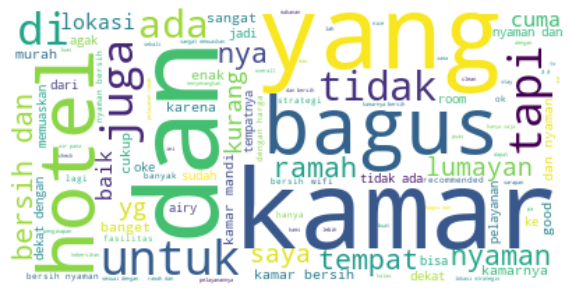

In [18]:
wordcloud = WordCloud(background_color="white",max_words=100).generate(bagus)

# Display the generated image:
plt.figure(figsize=[10,10])
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

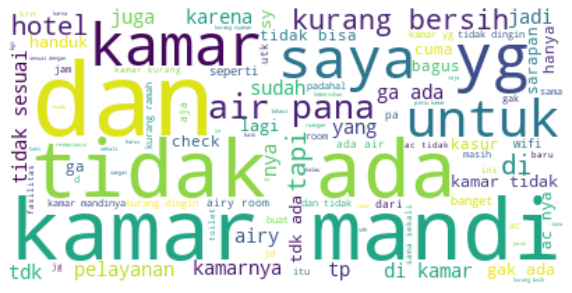

In [19]:
wordcloud = WordCloud(background_color="white",max_words=100).generate(jelek)

# Display the generated image:
plt.figure(figsize=[10,10])
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## Split Data

In [20]:
Review = datax.cleaned_review
Cat = datax.category

In [21]:
X_train, X_test, y_train, y_test = train_test_split(Review, Cat, random_state=42)

In [22]:
BATCH_SIZE = 32

## Tensorflow Pipeline

In [24]:
trainset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
testset = tf.data.Dataset.from_tensor_slices((X_test, y_test))

trainset = trainset.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
testset = testset.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

Hal di atas dilakukan supaya data bisa digunakan oleh model di tensorflow

In [25]:
for feat, tar in trainset.take(1):
    print(feat[:3])
    print(tar[:3])

tf.Tensor(
[b'lantai kamar mandi dan lanta kamar kurang bersih terasa licin '
 b'kamar oke lokasi oke tp sarapannya kurang enak\xc3\xb0\xc2\x9f\xc2\x99\xc2\x81 '
 b'bad place'], shape=(3,), dtype=string)
tf.Tensor([0 0 0], shape=(3,), dtype=int64)


## Cek Tokenisasi Kata

In [26]:
max_features = 10000
embedding_dim = 16

In [27]:
encoder = keras.layers.TextVectorization(max_tokens= max_features)
encoder.adapt(trainset.map(lambda feat, tar:feat))

In [28]:
encoder(feat)[:3]

<tf.Tensor: shape=(3, 47), dtype=int64, numpy=
array([[  74,    2,    9,    4, 4738,    2,    7,   13,  411,  571,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0],
       [   2,  119,   79,  119,   67,  421,    7, 9983,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0],
       [ 239,  515,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           

# Membangun Model

## Model 1

In [30]:
early_stop = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", min_delta=1e-2, patience=10, verbose=1, restore_best_weights=True)
reduce_lr_on_plateau = tf.keras.callbacks.ReduceLROnPlateau(monitor="val_accuracy", factor=1e-1, patience=5, verbose=1, min_delta=1e-2)

In [31]:
model = keras.Sequential()
model.add(encoder)
model.add(keras.layers.Embedding(
    input_dim=len(encoder.get_vocabulary()), 
    output_dim=embedding_dim, 
    mask_zero=True)
)
model.add(keras.layers.LSTM(16, return_sequences=True))
model.add(keras.layers.LSTM(8))
model.add(keras.layers.Dropout(0.5))
model.add(keras.layers.Dense(8))
model.add(keras.layers.Dropout(0.2))
model.add(keras.layers.Dense(1, activation="sigmoid"))

model.compile(loss="binary_crossentropy", 
              optimizer="adam",
              metrics=["accuracy"])

In [32]:
model.fit(trainset, validation_data=testset, batch_size=BATCH_SIZE, 
    epochs=100, callbacks=[early_stop, reduce_lr_on_plateau])

Epoch 1/100
349/349 [==============================] - 20s 42ms/step - loss: 0.3344 - accuracy: 0.9017 - val_loss: 0.1784 - val_accuracy: 0.9510 - lr: 0.0010
Epoch 2/100
349/349 [==============================] - 13s 36ms/step - loss: 0.1770 - accuracy: 0.9518 - val_loss: 0.1619 - val_accuracy: 0.9534 - lr: 0.0010
Epoch 3/100
349/349 [==============================] - 13s 36ms/step - loss: 0.1321 - accuracy: 0.9649 - val_loss: 0.1829 - val_accuracy: 0.9505 - lr: 0.0010
Epoch 4/100
349/349 [==============================] - 12s 36ms/step - loss: 0.1014 - accuracy: 0.9740 - val_loss: 0.2024 - val_accuracy: 0.9478 - lr: 0.0010
Epoch 5/100
349/349 [==============================] - 12s 36ms/step - loss: 0.0833 - accuracy: 0.9785 - val_loss: 0.2238 - val_accuracy: 0.9483 - lr: 0.0010
Epoch 6/100
348/349 [============================>.] - ETA: 0s - loss: 0.0659 - accuracy: 0.9836
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
349/349 [===========================

In [33]:
y_pred = model.predict(X_test)

(<Figure size 432x288 with 1 Axes>,
 <AxesSubplot:xlabel='predicted label', ylabel='true label'>)

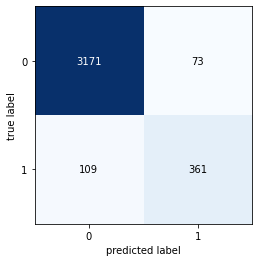

In [34]:
mat = confusion_matrix(y_test,np.round(y_pred))
plot_confusion_matrix(conf_mat=mat)

In [35]:
print(classification_report(y_test,np.round(y_pred),labels = [1,0]))

              precision    recall  f1-score   support

           1       0.83      0.77      0.80       470
           0       0.97      0.98      0.97      3244

    accuracy                           0.95      3714
   macro avg       0.90      0.87      0.89      3714
weighted avg       0.95      0.95      0.95      3714



## Model 2

In [36]:
model2 = keras.Sequential()
model2.add(encoder)
model2.add(keras.layers.Embedding(
    input_dim=len(encoder.get_vocabulary()), 
    output_dim=embedding_dim, 
    mask_zero=True)
)
model2.add(keras.layers.LSTM(16, return_sequences=True))
model2.add(keras.layers.LSTM(16))
model2.add(keras.layers.Dropout(0.5))
model2.add(keras.layers.Dense(8))
model2.add(keras.layers.Dense(1, activation="sigmoid"))

model2.compile(loss="binary_crossentropy", 
              optimizer="rmsprop",
              metrics=["accuracy"])

In [37]:
model2.fit(trainset, validation_data=testset, batch_size=BATCH_SIZE, 
    epochs=100, callbacks=[early_stop, reduce_lr_on_plateau])

Epoch 1/100
349/349 [==============================] - 19s 40ms/step - loss: 0.2943 - accuracy: 0.9104 - val_loss: 0.1780 - val_accuracy: 0.9486 - lr: 0.0010
Epoch 2/100
349/349 [==============================] - 12s 36ms/step - loss: 0.1784 - accuracy: 0.9470 - val_loss: 0.1544 - val_accuracy: 0.9534 - lr: 0.0010
Epoch 3/100
349/349 [==============================] - 12s 36ms/step - loss: 0.1535 - accuracy: 0.9532 - val_loss: 0.1492 - val_accuracy: 0.9540 - lr: 0.0010
Epoch 4/100
349/349 [==============================] - 14s 39ms/step - loss: 0.1437 - accuracy: 0.9563 - val_loss: 0.1480 - val_accuracy: 0.9548 - lr: 0.0010
Epoch 5/100
349/349 [==============================] - 15s 42ms/step - loss: 0.1372 - accuracy: 0.9574 - val_loss: 0.1476 - val_accuracy: 0.9529 - lr: 0.0010
Epoch 6/100
348/349 [============================>.] - ETA: 0s - loss: 0.1293 - accuracy: 0.9601
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
349/349 [===========================

In [38]:
y_pred2 = model2.predict(X_test)

(<Figure size 432x288 with 1 Axes>,
 <AxesSubplot:xlabel='predicted label', ylabel='true label'>)

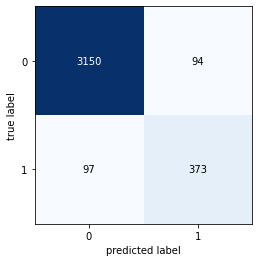

In [39]:
mat = confusion_matrix(y_test,np.round(y_pred2))
plot_confusion_matrix(conf_mat=mat)

In [40]:
print(classification_report(y_test,np.round(y_pred2),labels = [1,0]))

              precision    recall  f1-score   support

           1       0.80      0.79      0.80       470
           0       0.97      0.97      0.97      3244

    accuracy                           0.95      3714
   macro avg       0.88      0.88      0.88      3714
weighted avg       0.95      0.95      0.95      3714



In [50]:
model2.save_weights('model2_weights',save_format='tf')
model2.save('model2',save_format='tf')

2022-03-31 14:00:26.679 Found untraced functions such as lstm_cell_2_layer_call_fn, lstm_cell_2_layer_call_and_return_conditional_losses, lstm_cell_3_layer_call_fn, lstm_cell_3_layer_call_and_return_conditional_losses while saving (showing 4 of 4). These functions will not be directly callable after loading.


INFO:tensorflow:Assets written to: model2\assets


2022-03-31 14:00:28.821 Assets written to: model2\assets
2022-03-31 14:00:29.400 <keras.layers.recurrent.LSTMCell object at 0x00000215C9DAEA00> has the same name 'LSTMCell' as a built-in Keras object. Consider renaming <class 'keras.layers.recurrent.LSTMCell'> to avoid naming conflicts when loading with `tf.keras.models.load_model`. If renaming is not possible, pass the object in the `custom_objects` parameter of the load function.
2022-03-31 14:00:29.401 <keras.layers.recurrent.LSTMCell object at 0x00000215C9DCE130> has the same name 'LSTMCell' as a built-in Keras object. Consider renaming <class 'keras.layers.recurrent.LSTMCell'> to avoid naming conflicts when loading with `tf.keras.models.load_model`. If renaming is not possible, pass the object in the `custom_objects` parameter of the load function.


## Cek Model Terhadap Contoh Review Baru

In [59]:
contoh_review1 = ['kamar mandi kotor']
prediksi = model2.predict([contoh_review])
if prediksi.squeeze()>0.5:
    print(prediksi.squeeze())
    print('Sentimen Positif')
else:
    print(prediksi.squeeze())
    print('Sentimen Negatif')

0.32257307
Sentimen Negatif
